# Notebook 3 – Finding Characteristic n-grams (Relative Cohesion)

The goal of this notebook is to identify phrases that are **especially cohesive in the design context** compared to general English.  
We go beyond frequency (Notebook 2) and look at **differences in mutual information (PMI/NPMI)** between corpora.

A phrase can be common in both corpora but **“belong together”** more naturally in design talk.  
For example, *“opportunity area”* may also appear elsewhere, but its internal cohesion might be much stronger in design discussions.


**Rationale**

We already know:
- **Cohesion** (PMI) → how tightly words co-occur in a single corpus.  
- **Domain Specificity** (log ratio) → how much more often a phrase appears in one corpus.  

But a phrase may appear with **similar frequency** in both datasets and still carry **different relational strength**.  
Here, we measure that difference by comparing **PMI** (or its normalised version, NPMI) across corpora.

**Overview of the Method**

1. Compute PMI (or NPMI) for each n-gram in both corpora.
2. Align them on `ngram` and `ngram_length`.
3. Normalise PMI by length (z-scoring within bigrams and trigrams separately).
4. Compute ΔPMI (Session – Reference) and ΔPMIᶻ (the z-scored difference).


**Interpretation:**
- Positive ΔPMI → phrase has stronger cohesion in the design session → **characteristic** of design talk.  
- Negative ΔPMI → phrase has stronger cohesion in reference (everyday) language.



## 1. Inputs & Setup


In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 50)
sns.set_context('talk')

# Optional - Enable automatic reloading of modules when source code changes
# This eliminates the need to restart the kernel when updating external .py files.
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


We load:
- `session_ngrams`  (from Notebook 1 & 2) It contains PMI (`mi_in_session`) and frequency fields.  
- `reference_ngrams`  (with matching PMI from the reference corpus).  


In [40]:
session_ngrams = pd.read_csv('outputs/session_ngrams_2_effect_size.csv')
reference_ngrams = pd.read_csv('outputs/reference_ngrams.csv')

session_turns = pd.read_csv('outputs/session_turns.csv')
# reference_turns = pd.read_csv('data/switchboard_combined.csv')

print(f"all unique ngrams in session: {session_ngrams.shape}")
print(f"all unique ngrams in reference: {reference_ngrams.shape}")
print(f"session corpus size: {session_turns.shape}")
# print(f"Reference corpus shape: {reference_turns.shape}")

all unique ngrams in session: (170179, 14)
all unique ngrams in reference: (145569, 4)
session corpus size: (7686, 4)


## 2. General-language baseline: MI in merged corpus (session + reference)
We need a baseline MI for “everyday talk.” There are two practical options:

•	Reference-only (pure everyday language): compute MI from the reference counts. If an n-gram never appears in the reference, MI is undefined without smoothing.  
•	Merged baseline (reference + session): reduces zeros; the joint counts are more stable, but the baseline is slightly influenced by our session.

In this notebook we use the merged baseline for robustness against zeros (you can switch to reference-only with light smoothing; see code comment in the function).


In [41]:
# Unigrams for merged corpus
unis_s = (
    session_ngrams.query("ngram_length == 1")[["ngram","frequency_in_session"]]
    .set_index("ngram")["frequency_in_session"]
)
unis_r = (
    reference_ngrams.query("ngram_length == 1")[["ngram","frequency_in_reference"]]
    .set_index("ngram")["frequency_in_reference"]
)
unis_m = unis_s.add(unis_r, fill_value=0.0)
N_m = float(unis_m.sum())

# Phrases we care about = session phrases (keep existing mi_in_session)
phrases_s = session_ngrams.query("ngram_length >= 2")[["ngram","ngram_length","frequency_in_session","mi_in_session"]].copy()

# Reference phrase counts (for merged)
phr_r = (
    reference_ngrams.query("ngram_length >= 2")[["ngram","frequency_in_reference"]]
    .rename(columns={"frequency_in_reference":"freq_ref"})
)

phr_m = (
    phrases_s.rename(columns={"frequency_in_session":"freq_s"})
    .merge(phr_r, on="ngram", how="left")
)
phr_m["freq_ref"] = phr_m["freq_ref"].fillna(0.0)
phr_m["freq_merged"] = phr_m["freq_s"] + phr_m["freq_ref"]


The 'session_ngrams' and 'reference_ngrams' dataframes contains all the information we need to calculate the mutual information scores, without processing the corpus again. 

Here, we create a helper function to calculate MI by using the values in these dataframes. 

In [42]:
def mi_from_tables(phrase_text: str, phrase_count: float, unigram_counts: pd.Series, total_unigrams: float, k: float = 0.0) -> float:
    words = phrase_text.split()
    N = float(total_unigrams)
    if N <= 0:
        return float("-inf")
    denom = 1.0
    for w in words:
        uw = float(unigram_counts.get(w, 0.0))
        if k > 0:
            uw += k
        if uw <= 0:
            return float("-inf")
        denom *= (uw / (N + k * len(unigram_counts)))
    pc = float(phrase_count) + (k if k > 0 else 0.0)
    N_eff = N + (k if k > 0 else 0.0)
    if pc <= 0 or denom <= 0:
        return float("-inf")
    return float(np.log2((pc / N_eff) / denom))

### MI in merged corpus (general-language baseline)

In [43]:
phr_m["mi_in_merged"] = phr_m.apply(
    lambda r: mi_from_tables(r["ngram"], r["freq_merged"], unis_m, N_m, k=0.0),
    axis=1
)

### Computing Cohesion Differences across Corpora

ΔMI = MI_in_design_z − MI_in_reference_z  
This expresses how much more strongly the words associate in one corpus vs the other. Using the z-score version (ΔPMIᶻ) lets us compare bigrams and trigrams directly, since each length was normalised before comparison.


- **ΔPMI > 0** → more tightly bound in design talk (**characteristic collocation**).  
- **ΔPMI ≈ 0** → similar association strength in both contexts.  
- **ΔPMI < 0** → stronger association in everyday language.



In [44]:
from src.mi_visualization import normalise_values

# 5) Join back and compute diffs (and optional z-scores)
out = phrases_s.merge(phr_m[["ngram","mi_in_merged"]], on="ngram", how="left")
out["mi_diff"] = out["mi_in_session"] - out["mi_in_merged"]

# Main metric: session vs merged. Keep a z-scored version for comparability across lengths.
out = normalise_values(out, freq_col="mi_in_session", out_col="mi_in_session_z", method="zscore", group_by="ngram_length")
out = normalise_values(out, freq_col="mi_in_merged",  out_col="mi_in_merged_z",  method="zscore", group_by="ngram_length")
# z-difference as Session − Reference (merged)
out["mi_diff_z"] = out["mi_in_session_z"] - out["mi_in_merged_z"]

In [45]:
session_ngrams = session_ngrams.merge(out[['ngram', 'mi_in_merged_z', 'mi_diff_z']], on='ngram', how='left')


## 3. Results: Cohesion in Design vs Difference across Corpora




### Scatterplot: ΔPMI vs MI


This plot helps reveal what **Cohesion Differences (ΔMI)** add beyond Cohesion alone.  
Each point is an n-gram positioned by its internal cohesion in the design corpus (y-axis) and how that cohesion compares across corpora (x-axis).

- **x (→ right)** → more cohesive in **design** → **characteristic** phrase.  
- **x (← left)** → more cohesive in **reference** → **generic** phrase.  
- **y (↑ up)** → high overall cohesion in **design**.

Phrases in the **upper-right region** are both cohesive and distinctively stronger in design talk—the most promising characteristic n-grams.

In [46]:
import altair as alt
from src.mi_visualization import create_parametric_ngram_scatter
df = session_ngrams[
    (session_ngrams['mi_in_session_z'] > 0.0) &
    (session_ngrams['speaker_count'] > 1) &
    (session_ngrams['frequency_in_session'] > 3) & (session_ngrams['frequency_in_session'] < 100) &
    (session_ngrams['frequency_rank_within_length'] > 200) &
    (session_ngrams['ngram_length'] > 1) 
  #  (session_ngrams['significant']==True) &
  #  (session_ngrams['mi_diff_z'] > 0)
]

chart = create_parametric_ngram_scatter(
    df=df,
    x_col='mi_diff_z', x_mode='continuous', x_scale='linear', x_bin=False,
    y_col='mi_in_session_z', y_mode='continuous', y_scale='linear', y_bin=False,
    color_col='ngram_length', color_mode='categorical',
    color_scheme='tableau10',  # or 'category20', etc.
    opacity=0.9, 
    show_zero_axes=True,
    width=500, height=500,
    tick_fontsize=14,
    label_fontsize=14
)

chart

alt.LayerChart(...)

See how the the ngram examples with same y axis bin (similar MI) are changing from left to right. As MI_diff increases, 

### Example N-grams: ΔPMI vs MI

Axes
- **x (→ right)** = `mi_diff_z` → **more characteristic in design** (larger in session).  
   **Left** side → **more generic** (larger in reference).  
- **y (↑ up)** = `mi_in_session_z` → **more cohesive in design**.  

Reading the grid
- **Top-right**: high Cohesion in design + much lower in reference → best candidates.  
- **Top-left**: high Cohesion but common everywhere → generic phrases.  
- **Bottom-left**: weak Cohesion in both → discard.  

Color (`ngram_length`) distinguishes bigrams and trigrams.

/Users/skaraoglu/Documents/vis-analysis-designing_senthil/src/mi_visualization.py:1849: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(bottom=0.20)


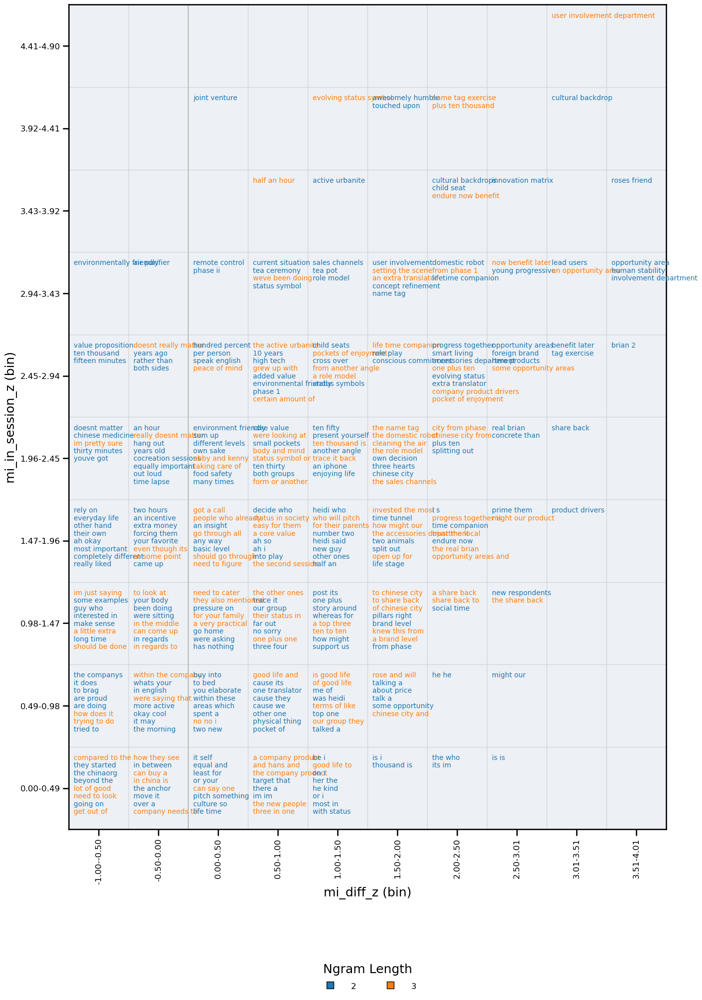

3083

In [50]:
from src.mi_visualization import ngram_examples_grid
import altair as alt

df = session_ngrams[
    (session_ngrams['mi_in_session_z'] > 0.0) &
    (session_ngrams['speaker_count'] > 1) &
    (session_ngrams['frequency_in_session'] > 3) & (session_ngrams['frequency_in_session'] < 100) &
    (session_ngrams['frequency_rank_within_length'] > 200) &
    (session_ngrams['ngram_length'] > 1) &
  #  (session_ngrams['significant']==True) &
    (session_ngrams['mi_diff_z'] > -1)
]


table_df, fig = ngram_examples_grid(
    df=df,
    x_col='mi_diff_z', x_mode='continuous', x_binning='linear', x_bins=10,
    y_col='mi_in_session_z',   y_mode='continuous', y_binning='linear', y_bins=10,
    color_col="ngram_length", color_mode='categorical', color_scheme='tableau10',
    
    examples_per_cell=8, wrap_width=30, figsize=(14, 20),
    tick_fontsize=12, label_fontsize=18, cell_text_fontsize=10,
    cell_fill='#e9edf2', cell_fill_alpha=0.7,
    show_zero_axes=True

)
plt.show()
len(df)


### ΔMI vs Frequency Rank

- **x (→ right)**: `mi_diff_z` — Cohesion difference (Session – Reference). Right = more characteristic.  
- **y (↑ up)**: `frequency_rank_within_length` — frequency rank of within = upper is rarer.

**Interpretation**
- **Upper right** → rare and characteristic (best candidates).  
- **Upper left** → rare but generic.  
- **Lower right** → frequent but characteristic (interesting fringe).  
- **Lower left** → rare and generic (noise).



/Users/skaraoglu/Documents/vis-analysis-designing_senthil/src/mi_visualization.py:1849: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(bottom=0.20)


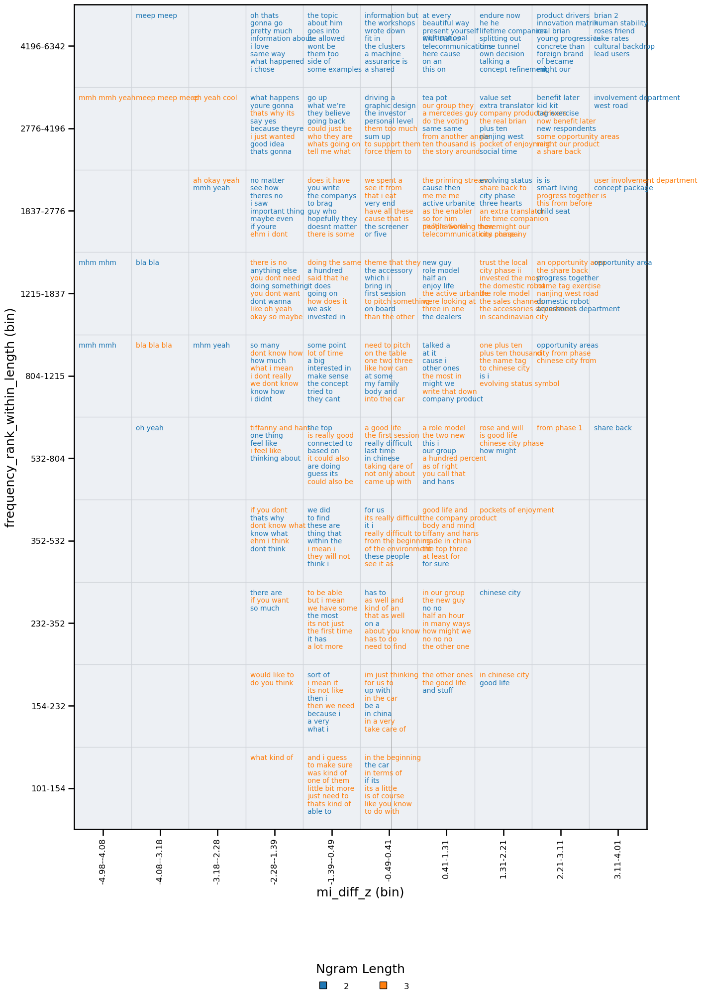

3835

In [57]:
from src.mi_visualization import ngram_examples_grid
import altair as alt

df = session_ngrams[
    (session_ngrams['mi_in_session_z'] > 0.0) &
   # (session_ngrams['speaker_count'] > 1) &
    (session_ngrams['frequency_in_session'] > 3) & (session_ngrams['frequency_in_session'] < 100) &
    (session_ngrams['frequency_rank_within_length'] > 100) &
    (session_ngrams['ngram_length'] > 1)
  #  (session_ngrams['mi_diff_z'] > 0)
]


table_df, fig = ngram_examples_grid(
    df=df,
    x_col='mi_diff_z', x_mode='continuous', x_binning='linear', x_bins=10,
    y_col='frequency_rank_within_length',   y_mode='continuous', y_binning='log', y_bins=10,
    color_col="ngram_length", color_mode='categorical', color_scheme='tableau10',
    
    examples_per_cell=8, wrap_width=30, figsize=(14, 20),
    tick_fontsize=12, label_fontsize=18, cell_text_fontsize=10,
    cell_fill='#e9edf2', cell_fill_alpha=0.7,
    show_zero_axes=True

)
plt.show()
len(df)


Below plot uses same axis but uses darker colors for high MI score.

/var/folders/p4/t8m9q5yj6_b72qcdyj5lkj50rl92j6/T/ipykernel_60612/1166850529.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis_r')
/Users/skaraoglu/Documents/vis-analysis-designing_senthil/src/mi_visualization.py:1849: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(bottom=0.20)


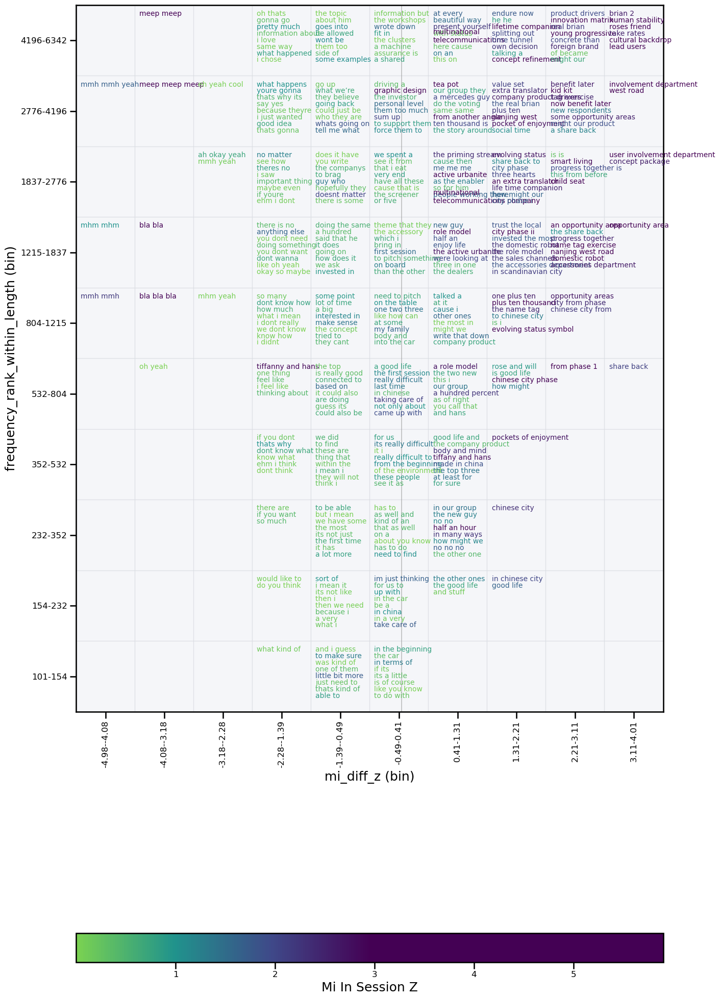

3835

In [65]:
from src.mi_visualization import ngram_examples_grid
from matplotlib import cm

cmap = cm.get_cmap('viridis_r')
trunc = [cmap(x) for x in np.linspace(0.2, 1.95, 7)]

df = session_ngrams[
    (session_ngrams['mi_in_session_z'] > 0.0) &
   # (session_ngrams['speaker_count'] > 1) &
    (session_ngrams['frequency_in_session'] > 3) & (session_ngrams['frequency_in_session'] < 100) &
    (session_ngrams['frequency_rank_within_length'] > 100) &
    (session_ngrams['ngram_length'] > 1)
  #  (session_ngrams['mi_diff_z'] > 0)
]


table_df, fig = ngram_examples_grid(
    df=df,
    x_col='mi_diff_z', x_mode='continuous', x_binning='linear', x_bins=10,
    y_col='frequency_rank_within_length',   y_mode='continuous', y_binning='log', y_bins=10,
    color_col='mi_in_session_z', color_mode='continuous', color_scheme='viridis', color_range=trunc,
    
    examples_per_cell=8, wrap_width=30, figsize=(14, 20),
    tick_fontsize=12, label_fontsize=18, cell_text_fontsize=10,
    show_zero_axes=True,
)
plt.show()
len(df)


# Appendix: Experiments with other methods

While this approach relies on z-score scaling within each corpus and n-gram length group, it is worth noting how this compares to established alternatives in corpus linguistics. 

Normalized PMI (NPMI) rescales each n-gram’s PMI value by its own joint probability, producing an intrinsic score between −1 and 1 that is directly comparable across datasets. In contrast, our z-normalisation is extrinsic: it positions each n-gram relative to the overall MI distribution of its length group, which highlights phrases that are unusually cohesive within that corpus. 

Another common alternative is logDice. Unlike MI, logDice is less sensitive to low-frequency events and was explicitly designed for comparability across corpora of different sizes, emphasising how representative a co-occurrence is for both of its component words. In short, our method is closer in spirit to PMI/NPMI, but we adapt it with corpus-internal z-scoring to capture relative distinctiveness within the design transcripts, rather than adopting logDice’s representativeness or NPMI’s absolute scaling.


## 1. NPMI vs. Current MI Normalisation

### What I currently do (PMI → z-score)

- Compute raw MI for each n-gram in each corpus: 
$$MI(w_1, w_2) = \log_2 \frac{P(w_1, w_2)}{P(w_1) \cdot P(w_2)}$$
 $$\mathrm{PMI}(w_1,\dots,w_n)= \log \frac{P(w_1,\dots,w_n)}{\prod_{i=1}^n P(w_i)}$$


- Normalise afterwards (distributional scaling):  
  - By n-gram length (e.g., bigrams vs trigrams): z-score MI within each length group so their scales are comparable.  
  - Across corpora: z-score MI within each corpus so “high MI” means “unusually cohesive relative to this corpus”.  
$$ z = \frac{\mathrm{MI} - \mu_{\ell}}{\sigma_{\ell}} \quad \text{for length group } \ell $$

- This is extrinsic scaling: values are made comparable post-hoc by referencing the distribution of other n-grams in the same group/corpus
- it highlights “unusually cohesive for this corpus/length.”

### What normalized PMI (NPMI) rescales PMI using the joint probability of the n-gram (intrinsic scaling)

- Pushes values to [-1,1] range
  - +1: always co-occur (perfect association)
  - 0: independent
  - -1: mutually exclusive (never co-occur)
- absolute comparability across corpora


$$
\mathrm{NPMI}(w_1,\dots,w_n)
= \frac{\mathrm{PMI}(w_1,\dots,w_n)}{-\log P(w_1,\dots,w_n)}
$$

The denominator, $-\log P(w_1,\dots,w_n)$, is the self-information (or surprisal) of the n-gram. By dividing PMI by this maximum possible information, the score is bounded between -1 and 1

### Calculating NPMI from known PMI (MI)

**NPMI in session**

In [67]:
import numpy as np
import pandas as pd

df = session_ngrams.copy()

# We only compute NPMI for n >= 2
mask = df["ngram_length"] >= 2

# --- Choose the denominator for P(ngram) ---
# Recommended: length-specific totals (so bigrams use total bigram tokens, etc.)
len_totals = (
    df.groupby("ngram_length")["frequency_in_session"]
      .sum()
      .rename("N_len")
)

# Merge length totals
df = df.merge(len_totals, on="ngram_length", how="left")

# Optional smoothing (set to 0.0 to disable)
k = 0.0

# Probability of the n-gram (length-specific)
p_ng = (df.loc[mask, "frequency_in_session"] + k) / (df.loc[mask, "N_len"] + k)

# Denominator for NPMI in base-2 (to match PMI base-2)
denom = -np.log2(p_ng)

# Compute NPMI safely
npmi = np.full(len(df), np.nan, dtype=float)
valid = mask & np.isfinite(df["mi_in_session"]) & np.isfinite(denom) & (denom > 0)
npmi[valid] = df.loc[valid, "mi_in_session"] / denom[valid]

df["npmi_in_session"] = npmi

# (Optional) keep only what you need
session_ngrams = df

**NPMI in reference**

In [68]:

df_s = session_ngrams.copy()      
df_r = reference_ngrams.copy()      

# We only compute NPMI for n >= 2
mask = df_s["ngram_length"] >= 2

# Bring reference frequencies onto session rows
df_s = df_s.merge(
    df_r[["ngram", "ngram_length", "frequency_in_reference"]],
    on=["ngram", "ngram_length"],
    how="left",
    suffixes=("", "_ref")
)

# Fill missing reference counts for session-only ngrams
df_s["frequency_in_reference"] = df_s["frequency_in_reference"].fillna(0.0).astype(float)

# Length-specific totals in reference (so P(ngram) is w.r.t. its own length)
len_totals_ref = (
    df_r.groupby("ngram_length")["frequency_in_reference"]
        .sum()
        .rename("N_len_ref")
    # index: ngram_length -> total ref tokens for that length
)

df_s = df_s.merge(len_totals_ref, on="ngram_length", how="left")

# Optional smoothing (set to 0.0 to disable)
k = 0.5

# --- Build reference unigram marginals for PMI in reference ---
ref_unigrams = df_r.query("ngram_length == 1")[["ngram", "frequency_in_reference"]]
u_ref = ref_unigrams.set_index("ngram")["frequency_in_reference"].astype(float)

N_ref = float(u_ref.sum())          # total unigram tokens in reference
V_ref = int(len(u_ref))             # unigram vocabulary size in reference

def p_unigram_ref(w: str) -> float:
    """Add-k smoothed unigram probability in reference."""
    uw = float(u_ref.get(w, 0.0))
    return (uw + k) / (N_ref + k * V_ref) if (N_ref + k * V_ref) > 0 else 0.0

def p_phrase_ref(count: float) -> float:
    """Smoothed phrase probability in reference (uses total unigrams, to mirror your session MI)."""
    return (count + k) / (N_ref + k) if (N_ref + k) > 0 else 0.0

def pmi_ref_base2(ngram: str, count: float) -> float:
    """PMI (log2) for an n-gram in the reference corpus."""
    words = str(ngram).split()
    if len(words) < 2:
        return np.nan
    # Π P(w_i) under independence
    prod_pw = 1.0
    for w in words:
        pw = p_unigram_ref(w)
        if pw <= 0 or not np.isfinite(pw):
            return np.nan
        prod_pw *= pw
    p_ng = p_phrase_ref(float(count))
    if p_ng <= 0 or not np.isfinite(p_ng):
        return np.nan
    return np.log2(p_ng / prod_pw)

# Compute PMI_ref (base-2) for n >= 2
mask_ref = df_s["ngram_length"] >= 2
df_s.loc[mask_ref, "mi_in_reference"] = df_s.loc[mask_ref, ["ngram", "frequency_in_reference"]].apply(
    lambda r: pmi_ref_base2(r["ngram"], r["frequency_in_reference"]),
    axis=1
).astype(float)

# Probability of the n-gram in the reference corpus (length-specific)
# Fill a full-length Series so indexing aligns with df_s
p_ng_ref = pd.Series(np.nan, index=df_s.index, dtype=float)
den_ref = (df_s.loc[mask, "N_len_ref"] + k)
num_ref = (df_s.loc[mask, "frequency_in_reference"] + k)

# Guard against zero denominators
safe = den_ref > 0
p_ng_ref.loc[mask] = np.where(safe, num_ref / den_ref, np.nan)
# Denominator for NPMI; keep base consistent with mi_in_reference
# If mi_in_reference is log2-based PMI, use log2 here:
denom_ref = -np.log2(p_ng_ref)

# Compute NPMI 
npmi_ref = np.full(len(df_s), np.nan, dtype=float)
valid = (
    mask
    & np.isfinite(df_s["mi_in_reference"])
    & np.isfinite(denom_ref)
    & (denom_ref > 0)
)

npmi_ref[valid] = df_s.loc[valid, "mi_in_reference"] / denom_ref[valid]

df_s["npmi_in_reference"] = npmi_ref

# (Optional) write back if you want the column on session_ngrams:
session_ngrams = df_s

###  NPMI difference: session vs reference

In [69]:
from src.mi_visualization import normalise_values

# Work on n-grams (n>=2)
mask = session_ngrams["ngram_length"] >= 2

# Select needed columns
npmi_out = session_ngrams.loc[mask, ["ngram", "ngram_length", "npmi_in_session", "npmi_in_reference"]].copy()

# Raw NPMI difference (Session − Reference)
npmi_out["npmi_diff"] = npmi_out["npmi_in_session"] - npmi_out["npmi_in_reference"]

# Optional: z-score NPMI within each length group for comparability
npmi_out = normalise_values(npmi_out, freq_col="npmi_in_session",
                            out_col="npmi_in_session_z", method="zscore", group_by="ngram_length")
npmi_out = normalise_values(npmi_out, freq_col="npmi_in_reference",
                            out_col="npmi_in_reference_z", method="zscore", group_by="ngram_length")
npmi_out["npmi_diff_z"] = npmi_out["npmi_in_session_z"] - npmi_out["npmi_in_reference_z"]

# Merge back to main frame
session_ngrams = session_ngrams.merge(
    npmi_out[["ngram", "npmi_diff", "npmi_diff_z", "npmi_in_session_z", "npmi_in_reference_z"]],
    on="ngram", how="left"
)

# (Optional) sanity checks
# session_ngrams.loc[mask, ["npmi_in_session", "npmi_in_reference", "npmi_diff"]].sample(5)

### Scatterplot: 'ΔNPMI vs ΔMI'


In [70]:
import altair as alt
from src.mi_visualization import create_parametric_ngram_scatter
df = session_ngrams[
    (session_ngrams['mi_in_session_z'] > 0.0) &
    (session_ngrams['speaker_count'] > 1) &
    (session_ngrams['frequency_in_session'] > 3) & (session_ngrams['frequency_in_session'] < 100) &
    (session_ngrams['frequency_rank_within_length'] > 200) &
    (session_ngrams['ngram_length'] > 1) 
  #  (session_ngrams['significant']==True) &
  #  (session_ngrams['mi_diff_z'] > 0)
]

chart = create_parametric_ngram_scatter(
    df=df,
    x_col='mi_diff_z', x_mode='continuous', x_scale='linear', x_bin=False,
    y_col='npmi_diff_z', y_mode='continuous', y_scale='linear', y_bin=False,
    color_col='ngram_length', color_mode='categorical',
    color_scheme='tableau10',  # or 'category20', etc.
    opacity=0.9, 
    show_zero_axes=True,
    width=500, height=500,
    tick_fontsize=14,
    label_fontsize=14
)

chart

alt.LayerChart(...)

If n-grams in the same column (ΔMI) and upper rows (ΔNPMI) seem more characteristic & distinctive, we can suggest that NPMI is a better metric to do cross corpus comparison 

/Users/skaraoglu/Documents/vis-analysis-designing_senthil/src/mi_visualization.py:1849: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(bottom=0.20)


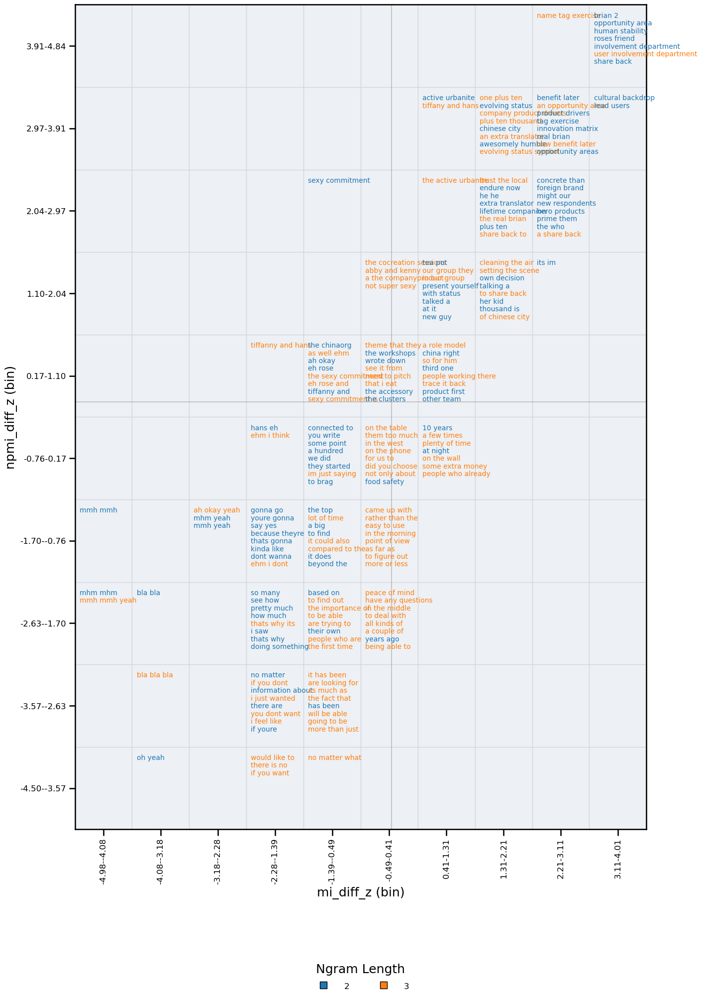

2271

In [77]:
table_df, fig = ngram_examples_grid(
    df=df,
    x_col='mi_diff_z', x_mode='continuous', x_binning='linear', x_bins=10,
    y_col='npmi_diff_z',   y_mode='continuous', y_binning='linear', y_bins=10,
    color_col="ngram_length", color_mode='categorical', color_scheme='tableau10',
    
    examples_per_cell=8, wrap_width=30, figsize=(14, 20),
    tick_fontsize=12, label_fontsize=18, cell_text_fontsize=10,
    cell_fill='#e9edf2', cell_fill_alpha=0.7,
    show_zero_axes=True

)
plt.show()
len(df)

### Scatterplots of 'ΔNPMI vs MI' & 'ΔMI vs MI'

In [71]:
import altair as alt
from src.mi_visualization import create_parametric_ngram_scatter
df = session_ngrams[
    (session_ngrams['mi_in_session_z'] > 0.0) &
    (session_ngrams['speaker_count'] > 1) &
    (session_ngrams['frequency_in_session'] > 3) & (session_ngrams['frequency_in_session'] < 100) &
    (session_ngrams['frequency_rank_within_length'] > 200) &
    (session_ngrams['ngram_length'] > 1) &
    (session_ngrams['significant'].isnull() | (session_ngrams['significant'] == True)) # only statistically significant difference or session-only phrases
  #  (session_ngrams['mi_diff_z'] > 0)
]

chart = create_parametric_ngram_scatter(
    df=df,
    x_col='mi_diff_z', x_mode='continuous', x_scale='linear', x_bin=False,
    y_col='mi_in_session_z', y_mode='continuous', y_scale='linear', y_bin=False,
    color_col='ngram_length', color_mode='categorical',
    color_scheme='tableau10',  # or 'category20', etc.
    opacity=0.9, 
    show_zero_axes=True,
    width=500, height=500,
    tick_fontsize=14,
    label_fontsize=14
)

chart

alt.LayerChart(...)

In [72]:
import altair as alt
from src.mi_visualization import create_parametric_ngram_scatter

chart = create_parametric_ngram_scatter(
    df=df,
    x_col='npmi_diff_z', x_mode='continuous', x_scale='linear', x_bin=False,
    y_col='npmi_in_session_z', y_mode='continuous', y_scale='linear', y_bin=False,
    color_col='ngram_length', color_mode='categorical',
    color_scheme='tableau10',  # or 'category20', etc.
    opacity=0.9, 
    show_zero_axes=True,
    width=500, height=500,
    tick_fontsize=14,
    label_fontsize=14
)

chart

alt.LayerChart(...)

### Example N-grams: ΔNPMI vs MI


/Users/skaraoglu/Documents/vis-analysis-designing_senthil/src/mi_visualization.py:1849: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(bottom=0.20)


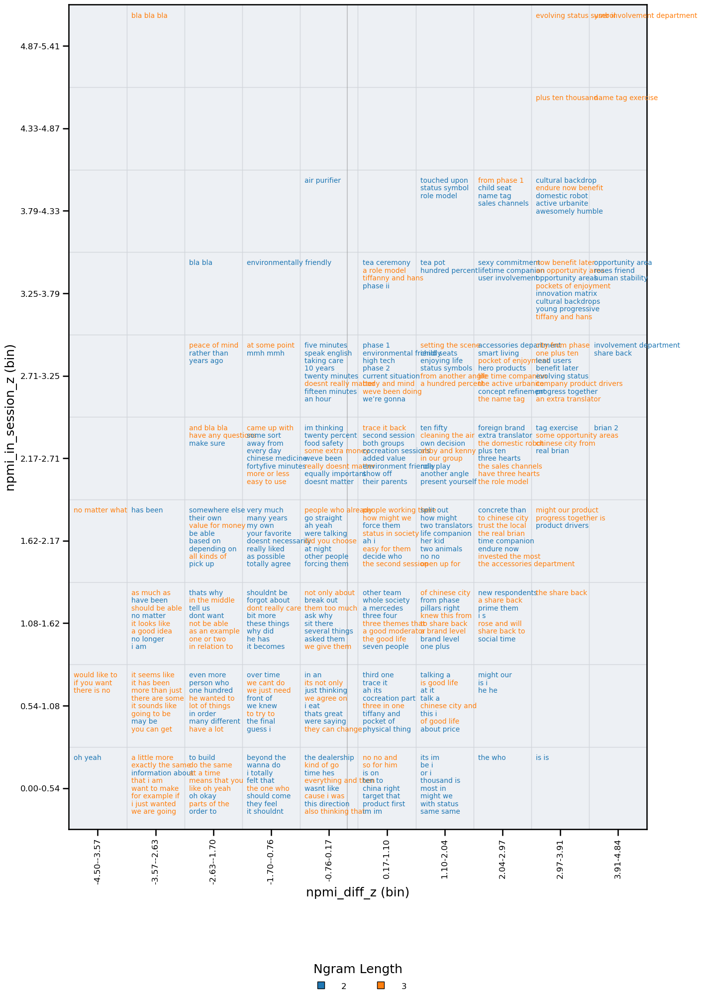

2271

In [76]:
table_df, fig = ngram_examples_grid(
    df=df,
    x_col='npmi_diff_z', x_mode='continuous', x_binning='linear', x_bins=10,
    y_col='npmi_in_session_z',   y_mode='continuous', y_binning='linear', y_bins=10,
    color_col="ngram_length", color_mode='categorical', color_scheme='tableau10',
    
    examples_per_cell=8, wrap_width=30, figsize=(14, 20),
    tick_fontsize=12, label_fontsize=18, cell_text_fontsize=10,
    cell_fill='#e9edf2', cell_fill_alpha=0.7,
    show_zero_axes=True

)
plt.show()
len(df)

/Users/skaraoglu/Documents/vis-analysis-designing_senthil/src/mi_visualization.py:1849: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(bottom=0.20)


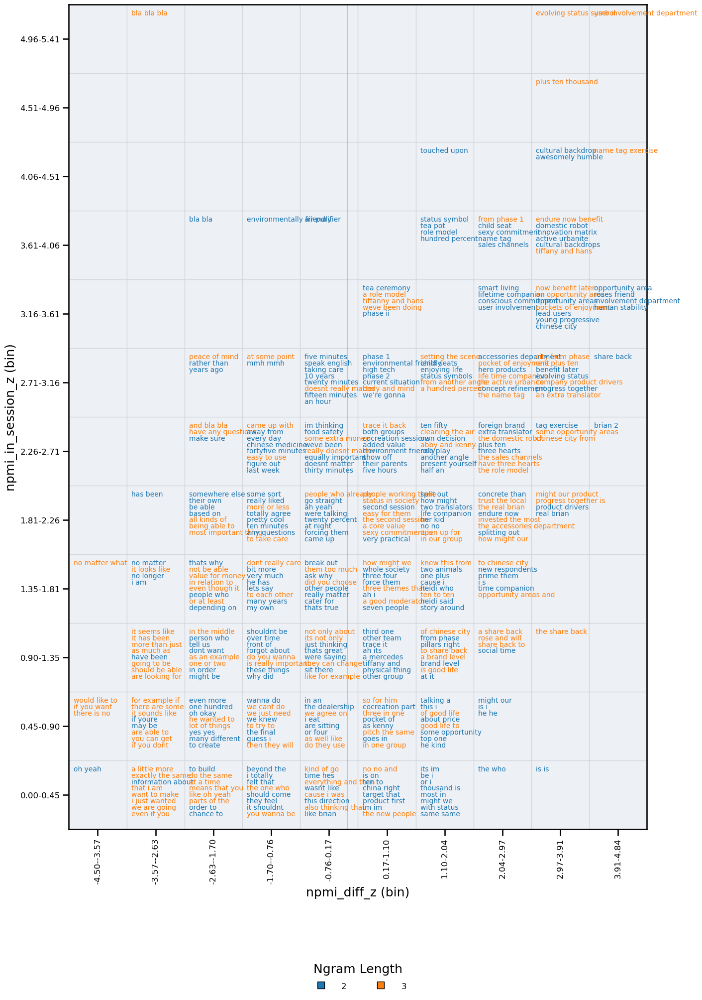

2271

In [74]:
table_df, fig = ngram_examples_grid(
    df=df,
    x_col='npmi_diff_z', x_mode='continuous', x_binning='linear', x_bins=10,
    y_col='npmi_in_session_z',   y_mode='continuous', y_binning='linear', y_bins=12,
    color_col="ngram_length", color_mode='categorical', color_scheme='tableau10',
    
    examples_per_cell=8, wrap_width=30, figsize=(14, 20),
    tick_fontsize=12, label_fontsize=18, cell_text_fontsize=10,
    cell_fill='#e9edf2', cell_fill_alpha=0.7,
    show_zero_axes=True

)
plt.show()
len(df)

## 2. LogDice

# Save


In [78]:
session_ngrams.to_csv('outputs/session_ngrams_3.csv', index=False)